<div style="text-align: right">Group 4: <br> </div>
<div style="text-align: right">Viswanath Raju Indukuri <br> </div>
<div style="text-align: right">Arnab Chakraborty <br> </div>

--------------------------------------------------------------------------------------------

# Final Project: INFO6106 Neural Modeling Methods & Tools



# Lake Effect Precipitation Prediction using CNN and RNN

**Import necessary libraries**

In [1]:
import os
import pandas as pd
import numpy as np

# Plotting libraries
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

**Read the data**

In [2]:
# Read the CSV file into the original DataFrame
original_les_data = pd.read_csv('les_data.csv')

# Create a copy of the original DataFrame for making further changes
les = original_les_data.copy()

# Set max_columns option to None to display all columns
pd.set_option('display.max_columns', None)

# Print the first few rows of the DataFrame
les

,DateTime_UTC,Lake_data_1D,Lake_data_2D,Temp_F,RH_pct,Wind_Spd_mph,Wind_Direction_deg,Low_Cloud_Ht_ft,Visibility_mi,Atm_Press_hPa,Precip_in
0,2006-10-01 00:00:00,"[0.0075, 0.0025, 0.0, 0.005, 0.0, 0.005, nan, ...","[array([ nan, nan, nan, nan, nan...",48.0,86.0,7,150,4100,10,984.0,0.00
1,2006-10-01 01:00:00,"[0.0025, nan, 0.0025, 0.0025, nan, 0.0, nan, 0...","[array([ nan, nan, nan, nan, nan...",48.0,86.0,8,150,6000,10,983.7,0.00
2,2006-10-01 02:00:00,"[0.0, nan, 0.0075, nan, nan, 0.0025, nan, nan,...","[array([nan, nan, nan, nan, nan, nan, nan, nan...",48.0,86.0,6,150,5500,10,982.7,0.00
3,2006-10-01 03:00:00,"[0.0025, nan, 0.0025, 0.0, 0.0075, nan, 0.005,...","[array([nan, nan, nan, nan, nan, nan, nan, nan...",48.0,86.0,8,150,6000,10,982.0,0.00
4,2006-10-01 04:00:00,"[0.0025, nan, 0.0, nan, 0.0075, 0.0, nan, nan,...","[array([ nan, nan, nan, nan, nan...",48.0,89.0,5,150,2200,8,982.0,0.02
...,...,...,...,...,...,...,...,...,...,...,...
48116,2017-03-31 19:00:00,"[0.75, 0.78249997, 0.805, 0.78999996, 0.789999...","[array([ nan, nan, nan, nan, nan...",40.0,76.0,0,0,5000,10,991.7,0.00
48117,2017-03-31 20:00:00,"[0.76, 0.675, 0.72249997, 0.7175, 0.73249996, ...","[array([ nan, nan, nan, nan, nan...",39.0,72.0,3,20,5000,10,992.3,0.00
48118,2017-03-31 21:00:00,"[0.6225, 0.6375, 0.6525, 0.66499996, 0.6725, 0...","[array([ nan, nan, nan, nan, nan...",35.0,84.0,5,300,5000,10,993.3,0.00
48119,2017-03-31 22:00:00,"[0.4325, 0.45999998, 0.4725, 0.465, 0.45, 0.44...","[array([ nan, nan, nan, nan, nan...",34.0,85.0,0,0,5000,10,993.3,0.00


----

# 1. Visualizations

## **Total Yearly Precipitation**

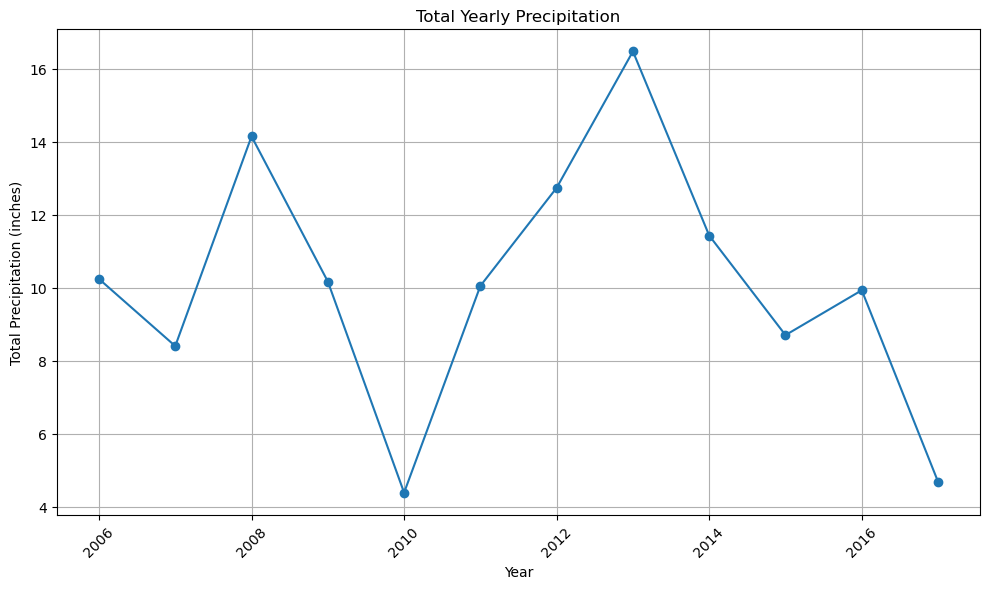

In [3]:
# Convert 'DateTime_UTC' to datetime
les['DateTime_UTC'] = pd.to_datetime(les['DateTime_UTC'])

# Group by year and aggregate precipitation
yearly_precipitation = les.groupby(les['DateTime_UTC'].dt.year)['Precip_in'].sum()

# Plotting
plt.figure(figsize=(10, 6))
yearly_precipitation.plot(marker='o', linestyle='-')
plt.title('Total Yearly Precipitation')
plt.xlabel('Year')
plt.ylabel('Total Precipitation (inches)')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [4]:
# Print yearly precipitation values
print("Yearly Precipitation:")
print(yearly_precipitation)

Yearly Precipitation:
DateTime_UTC
2006    10.24
2007     8.40
2008    14.15
2009    10.17
2010     4.38
2011    10.05
2012    12.74
2013    16.48
2014    11.43
2015     8.70
2016     9.93
2017     4.68
Name: Precip_in, dtype: float64


----

## Aggregated monthly precipitation plot for each year

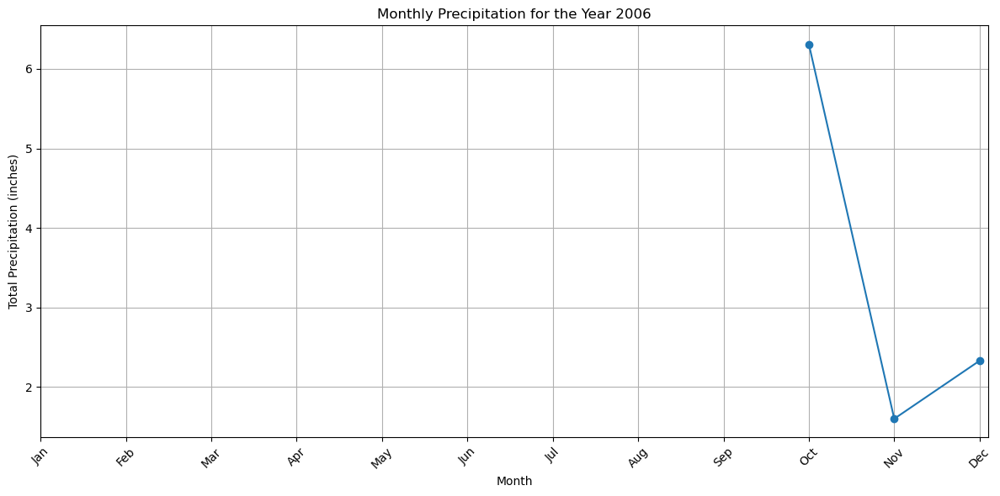

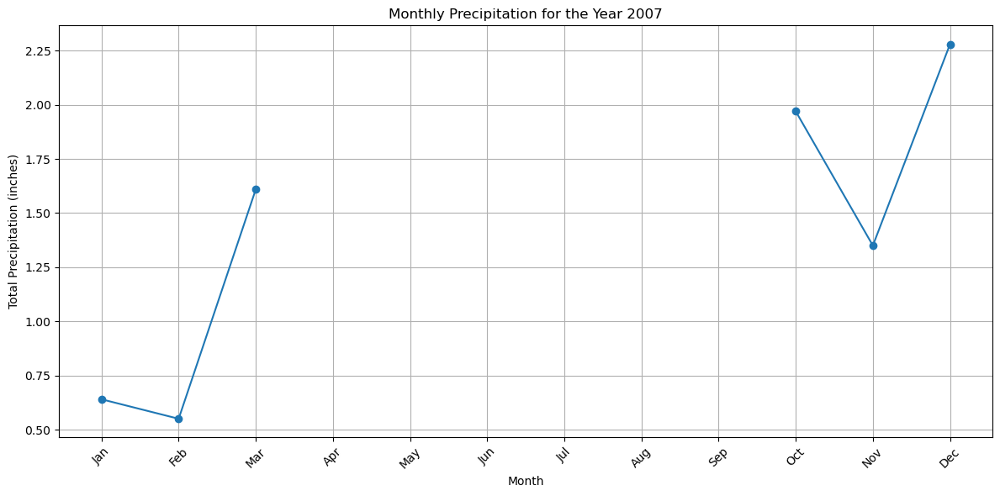

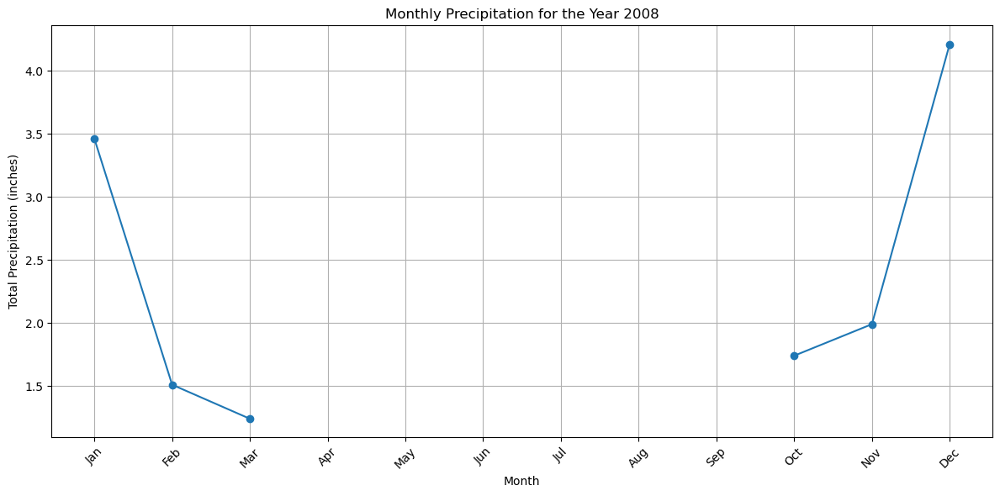

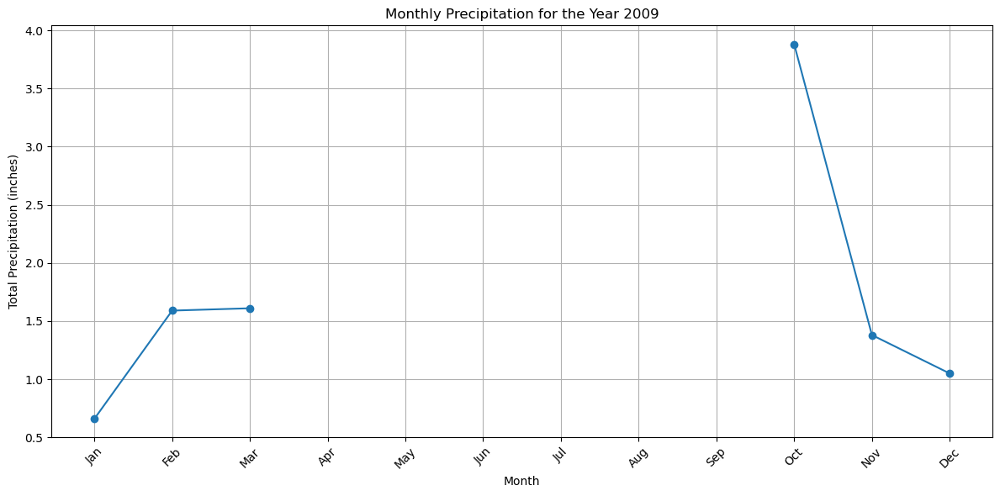

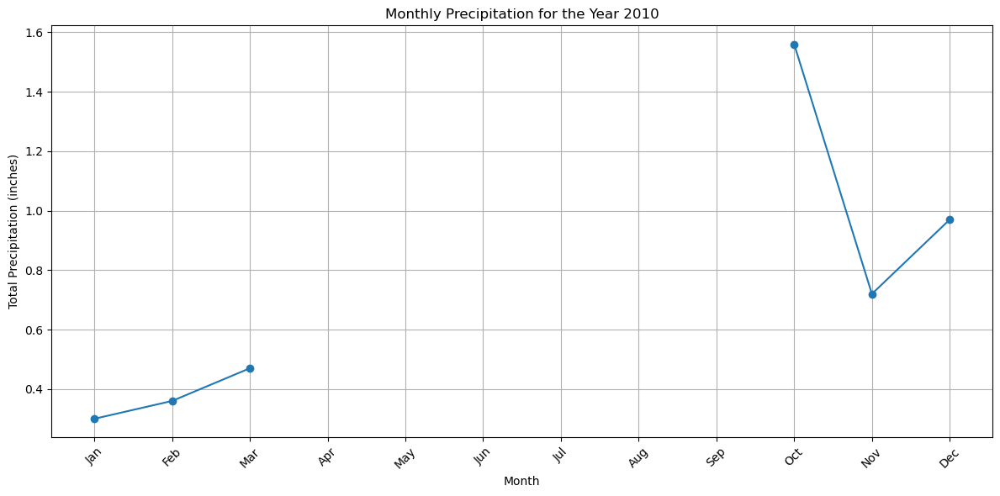

...

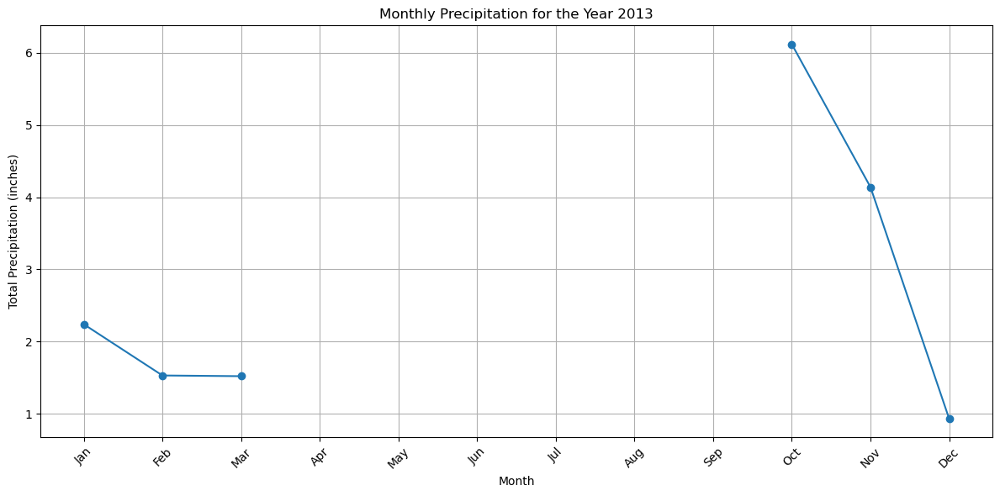

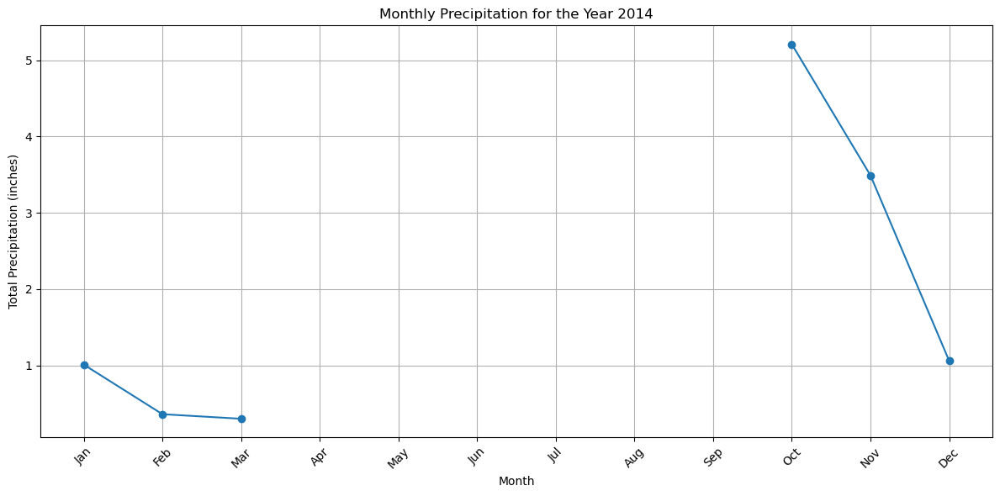

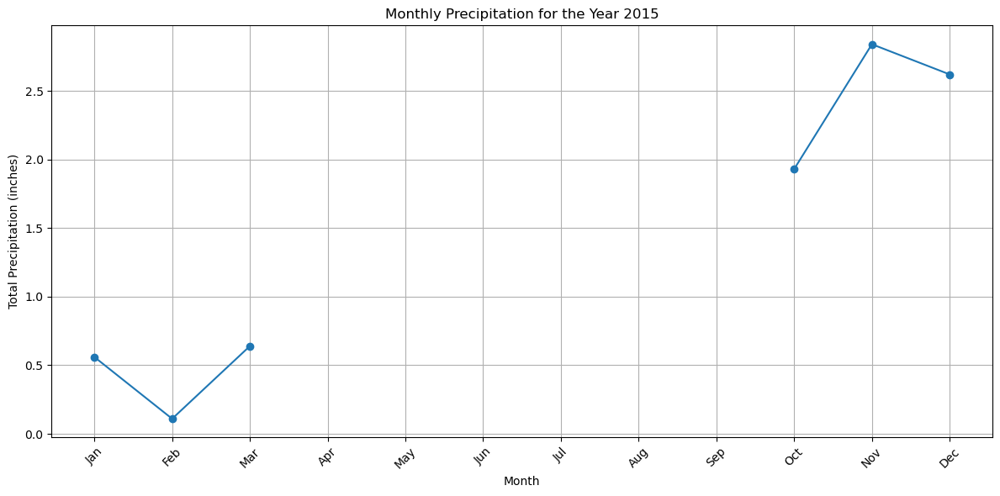

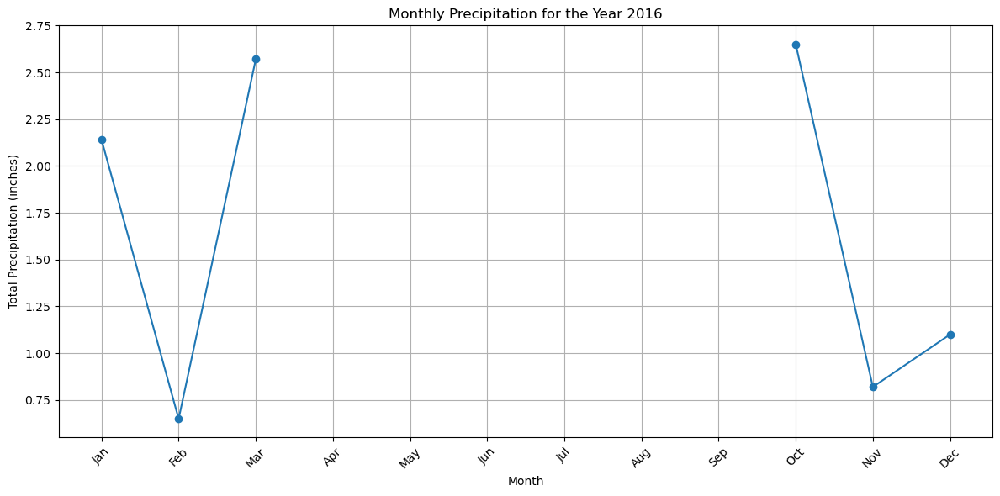

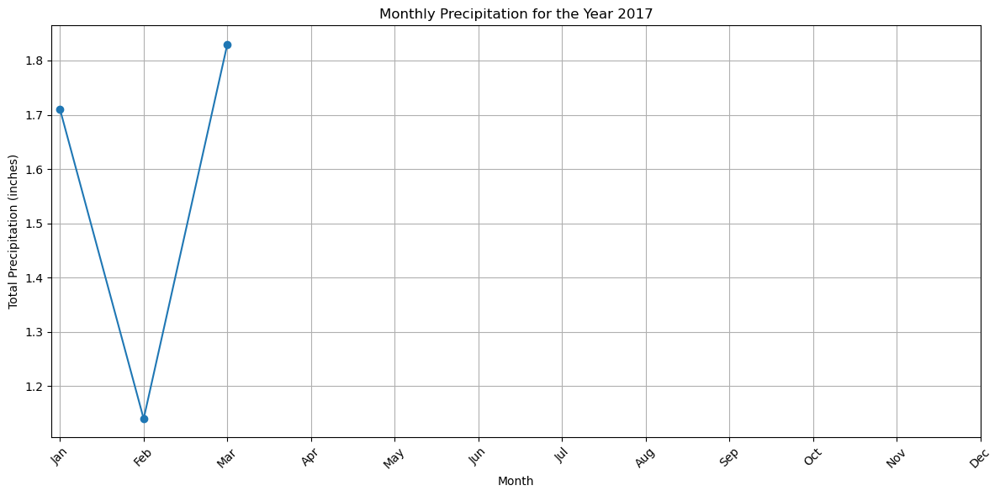

In [5]:
# Define month names and numbers for alignment
months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
month_numbers = range(1, 13)  # Corresponding month numbers

# Iterate through years from 2006 to 2017
for year in range(2006, 2018):
    # Filter data for the current year
    les_year = les[les['DateTime_UTC'].dt.year == year].copy()  # Make a copy to avoid SettingWithCopyWarning
    
    # Extract year and month from the datetime column using .loc for assignment
    les_year.loc[:, 'Year'] = les_year['DateTime_UTC'].dt.year
    les_year.loc[:, 'Month'] = les_year['DateTime_UTC'].dt.month
    
    # Group by month and aggregate precipitation
    monthly_precipitation = les_year.groupby('Month')['Precip_in'].sum()

    # Create a full DataFrame covering all months
    full_monthly_data = pd.DataFrame({'Month': month_numbers})
    full_monthly_data = full_monthly_data.set_index('Month')
    full_monthly_data['Precip_in'] = monthly_precipitation

    # Plotting
    plt.figure(figsize=(12, 6))
    plt.plot(months, full_monthly_data['Precip_in'], marker='o', linestyle='-', drawstyle='default')  # Only connect points that have data
    plt.title(f'Monthly Precipitation for the Year {year}')
    plt.xlabel('Month')
    plt.ylabel('Total Precipitation (inches)')
    plt.xticks(range(12), months, rotation=45)  # Ensure x-ticks are properly labeled with month names
    plt.grid(True)
    plt.tight_layout()
    plt.show()

In [6]:
# Define month names and numbers for alignment
months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
month_numbers = range(1, 13)  # Corresponding month numbers

# Iterate through years from 2006 to 2017
for year in range(2006, 2018):
    # Filter data for the current year
    les_year = les[les['DateTime_UTC'].dt.year == year].copy()  # Make a copy to avoid SettingWithCopyWarning
    
    # Extract year and month from the datetime column using .loc for assignment
    les_year.loc[:, 'Year'] = les_year['DateTime_UTC'].dt.year
    les_year.loc[:, 'Month'] = les_year['DateTime_UTC'].dt.month
    
    # Group by month and aggregate precipitation
    monthly_precipitation = les_year.groupby('Month')['Precip_in'].sum()

    # Create a full DataFrame covering all months
    full_monthly_data = pd.DataFrame({'Month': month_numbers})
    full_monthly_data = full_monthly_data.set_index('Month')
    full_monthly_data['Precip_in'] = monthly_precipitation

    # Print monthly precipitation values for the current year
    print(f"Monthly Precipitation for the Year {year}:")
    print(full_monthly_data)


Monthly Precipitation for the Year 2006:
       Precip_in
Month           
1            NaN
2            NaN
3            NaN
4            NaN
5            NaN
6            NaN
7            NaN
8            NaN
9            NaN
10          6.31
11          1.60
12          2.33
Monthly Precipitation for the Year 2007:
       Precip_in
Month           
1           0.64
2           0.55
3           1.61
4            NaN
5            NaN
6            NaN
7            NaN
8            NaN
9            NaN
10          1.97
11          1.35
12          2.28
Monthly Precipitation for the Year 2008:
       Precip_in
Month           
1           3.46
2           1.51
3           1.24
4            NaN
5            NaN
6            NaN
7            NaN
8            NaN
9            NaN
10          1.74
11          1.99
12          4.21
Monthly Precipitation for the Year 2009:
       Precip_in
Month           
1           0.66
2           1.59
3           1.61
4            NaN
5            NaN
6  

-----

## Monthly Observations Scatter plot for each year

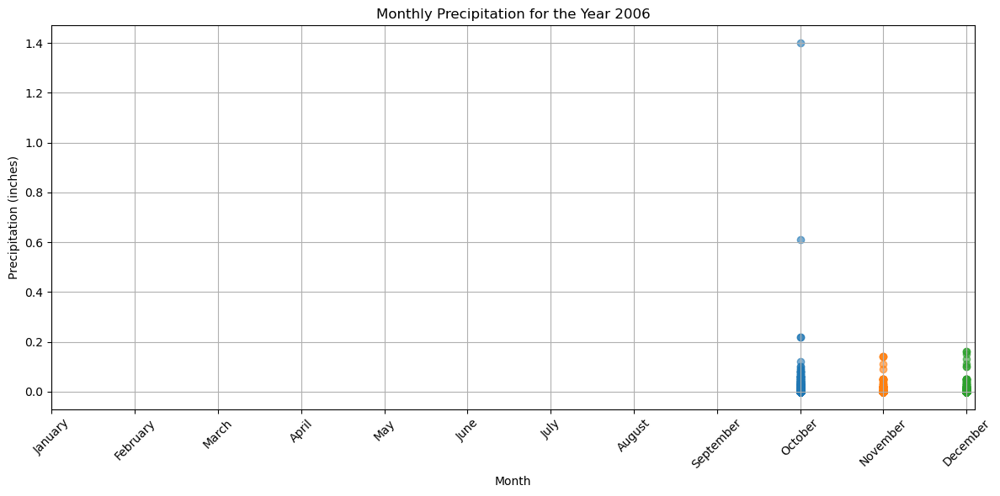

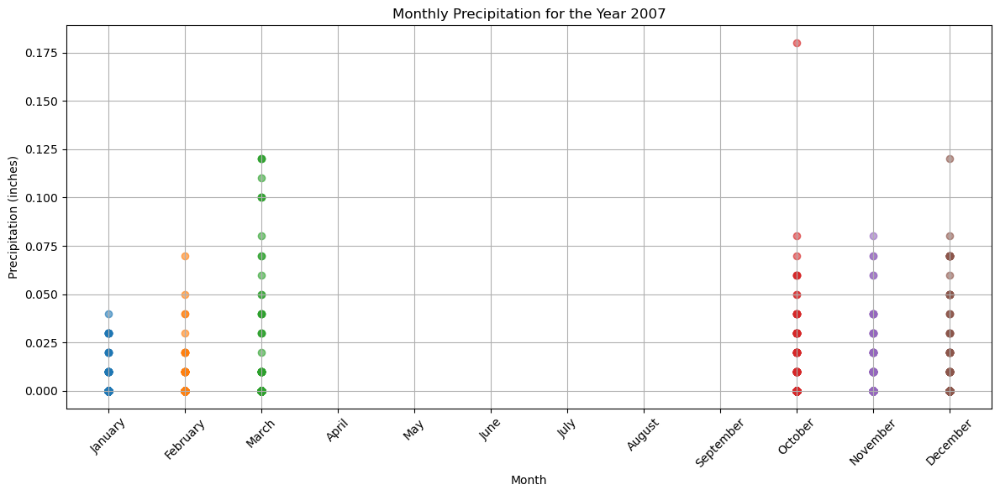

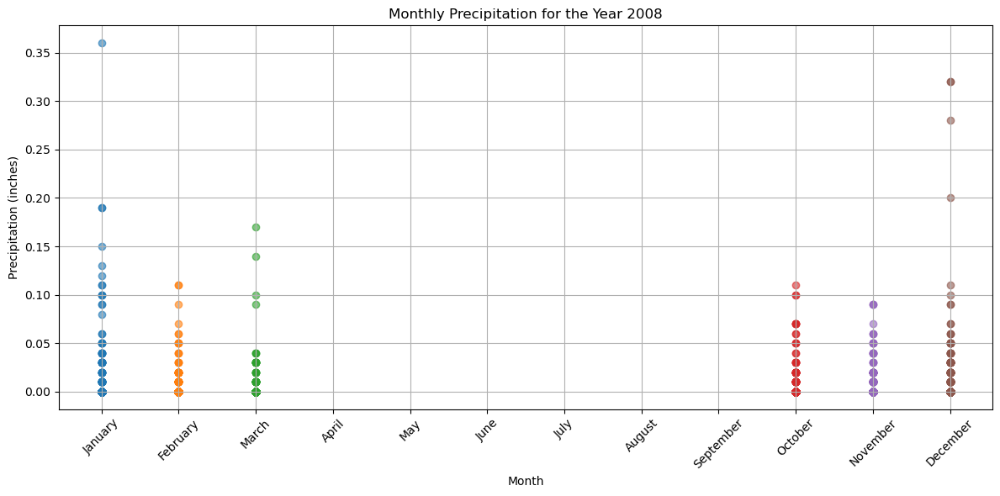

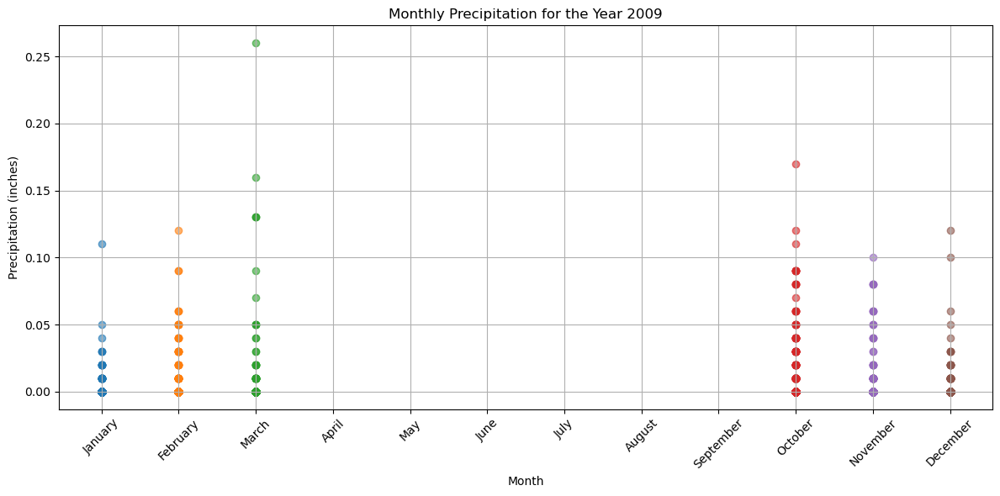

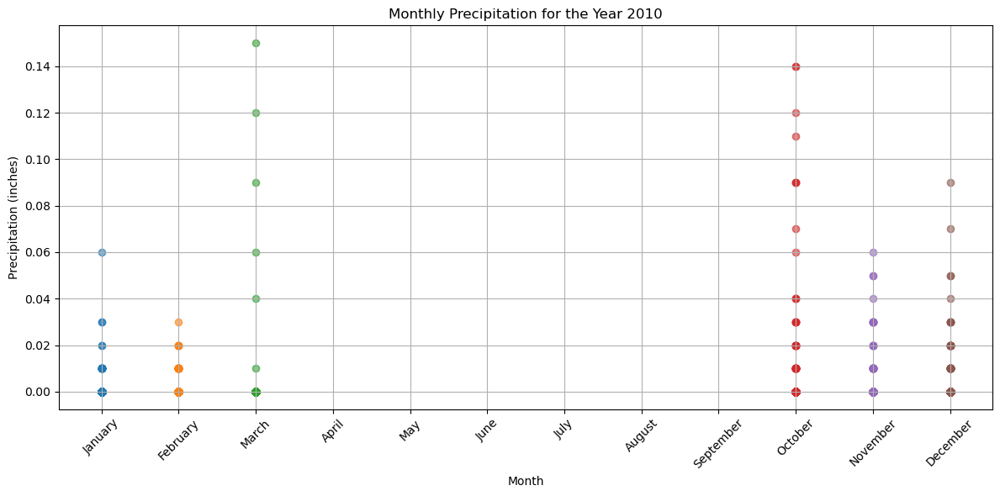

...

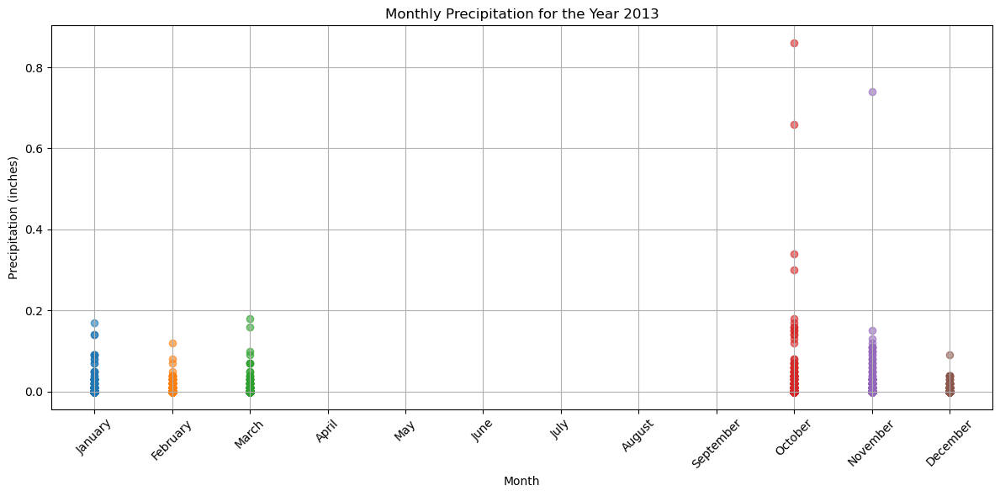

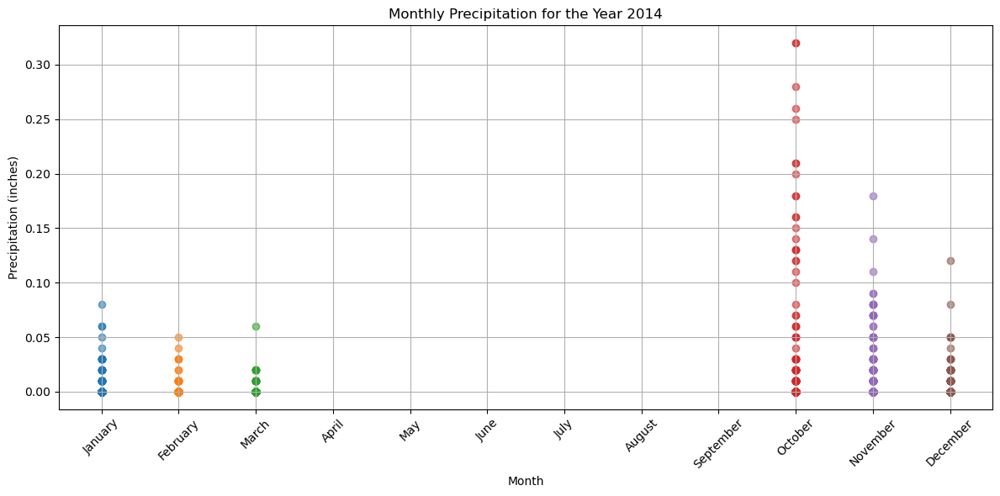

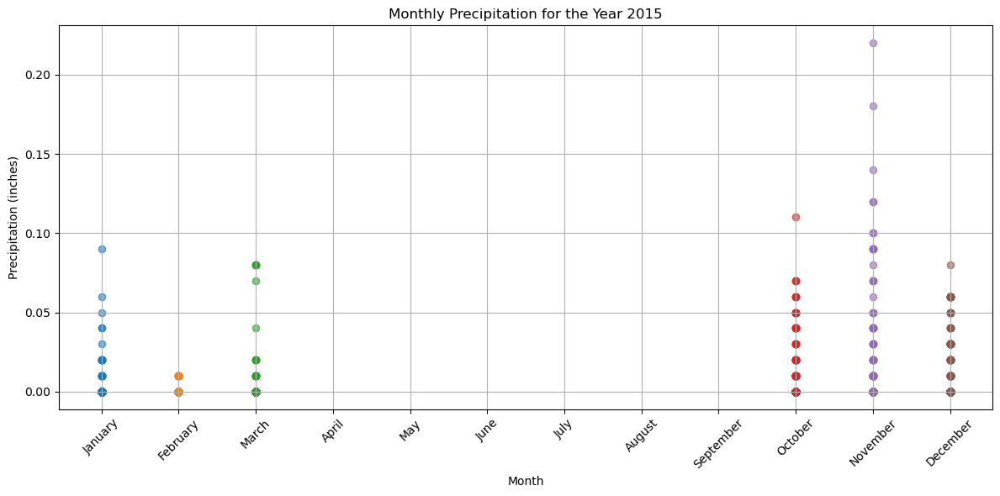

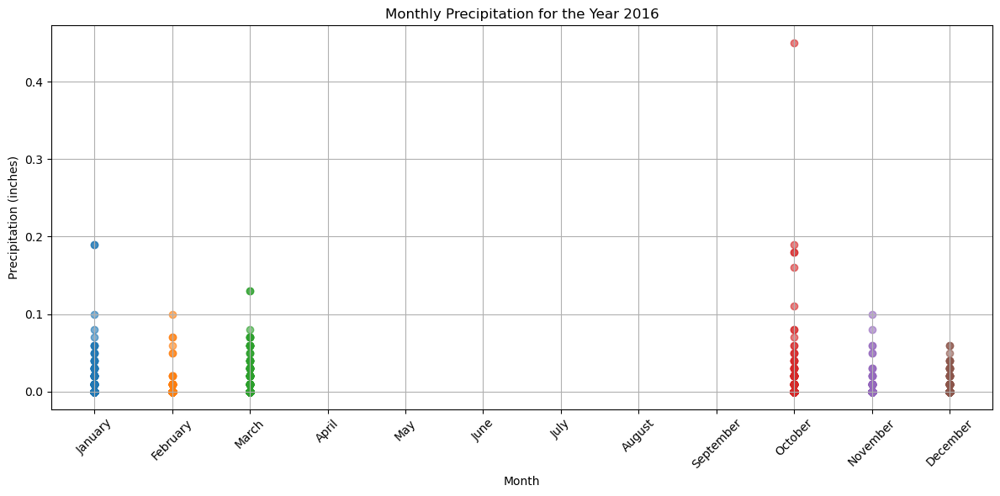

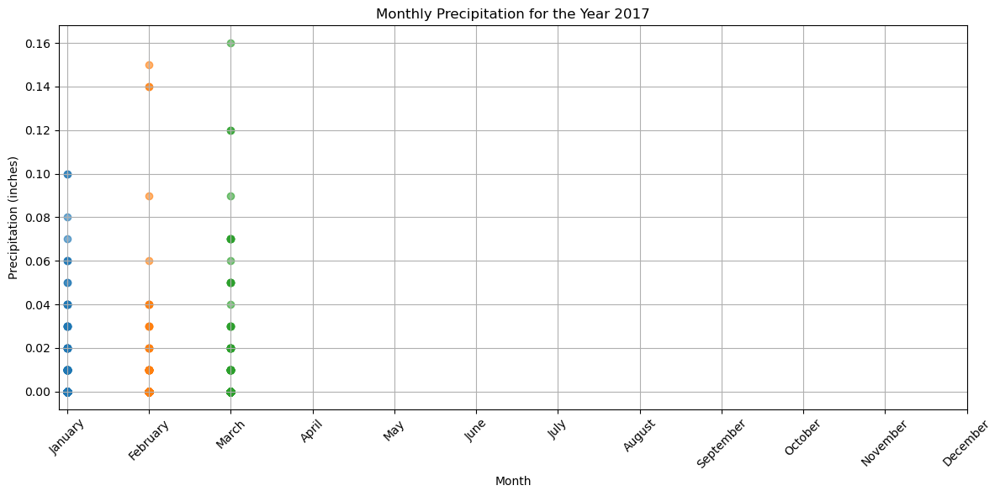

In [8]:
import matplotlib.pyplot as plt
import calendar

# Iterate through years from 2006 to 2017
for year in range(2006, 2018):
    # Filter data for the current year
    les_year = les[les['DateTime_UTC'].dt.year == year].copy()  # Make a copy to avoid SettingWithCopyWarning
    
    # Extract year and month from the datetime column using .loc for assignment
    les_year.loc[:, 'Year'] = les_year['DateTime_UTC'].dt.year
    les_year.loc[:, 'Month'] = les_year['DateTime_UTC'].dt.month
    
    # Group by year and month but do not aggregate, just keep all values
    grouped_data = les_year.groupby(['Year', 'Month'])['Precip_in']
    
    # Plotting
    plt.figure(figsize=(12, 6))
    for (year, month), group in grouped_data:
        month_name = calendar.month_name[month]  # Get month name
        plt.scatter([month]*len(group), group, alpha=0.6, label=f'{month_name}')  # Plot all points for each month
    
    plt.title(f'Monthly Precipitation for the Year {year}')
    plt.xlabel('Month')
    plt.ylabel('Precipitation (inches)')
    plt.xticks(range(1, 13), calendar.month_name[1:13], rotation=45)  # Show all months on x-axis
    plt.grid(True)
    plt.tight_layout()
    plt.show()

----

## Time Series Precipitation plot

In [9]:
import plotly.express as px

In [10]:
# Sort by 'DateTime_UTC' and drop any duplicates
les = les.sort_values('DateTime_UTC').drop_duplicates(subset='DateTime_UTC')

# Create a full range of dates from the start to the end of your dataset
start_date = les['DateTime_UTC'].min()
end_date = les['DateTime_UTC'].max()
full_date_range = pd.date_range(start=start_date, end=end_date, freq='H')

# Reindex 'les' with the full date range, introducing NaN for missing dates
les_reindexed = les.set_index('DateTime_UTC').reindex(full_date_range).reset_index()

# Rename the 'index' column back to 'DateTime_UTC'
les_reindexed.rename(columns={'index': 'DateTime_UTC'}, inplace=True)

# Now NaNs are introduced for missing dates, let's create the plot
fig = px.line(les_reindexed, x='DateTime_UTC', y='Precip_in', title='Yearly Precipitation')

# Format the hover data to show the date and time in a more readable format including the hour
fig.update_traces(hovertemplate='%{x}<extra>Precipitation: %{y} inches</extra>')

# Update the axes to include a range slider and range buttons for 1 year, 2 years, 3 years, and all data
fig.update_xaxes(
    rangeslider_visible=True,
    rangeselector=dict(
        buttons=list([
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(count=2, label="2y", step="year", stepmode="backward"),
            dict(count=3, label="3y", step="year", stepmode="backward"),
            dict(count=4, label="4y", step="year", stepmode="backward"),
            dict(count=5, label="5y", step="year", stepmode="backward"),
            dict(count=6, label="6y", step="year", stepmode="backward"),
            dict(count=7, label="7y", step="year", stepmode="backward"),
            dict(count=8, label="8y", step="year", stepmode="backward"),
            dict(count=9, label="9y", step="year", stepmode="backward"),
            dict(count=10, label="10y", step="year", stepmode="backward"),
            dict(count=11, label="11y", step="year", stepmode="backward"),
            dict(count=12, label="12y", step="year", stepmode="backward"),
            dict(step="all")
        ])
    )
)

# Show the figure
fig.show()

----

# 2. Pair Plots

C:\Users\91833\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning:

The figure layout has changed to tight



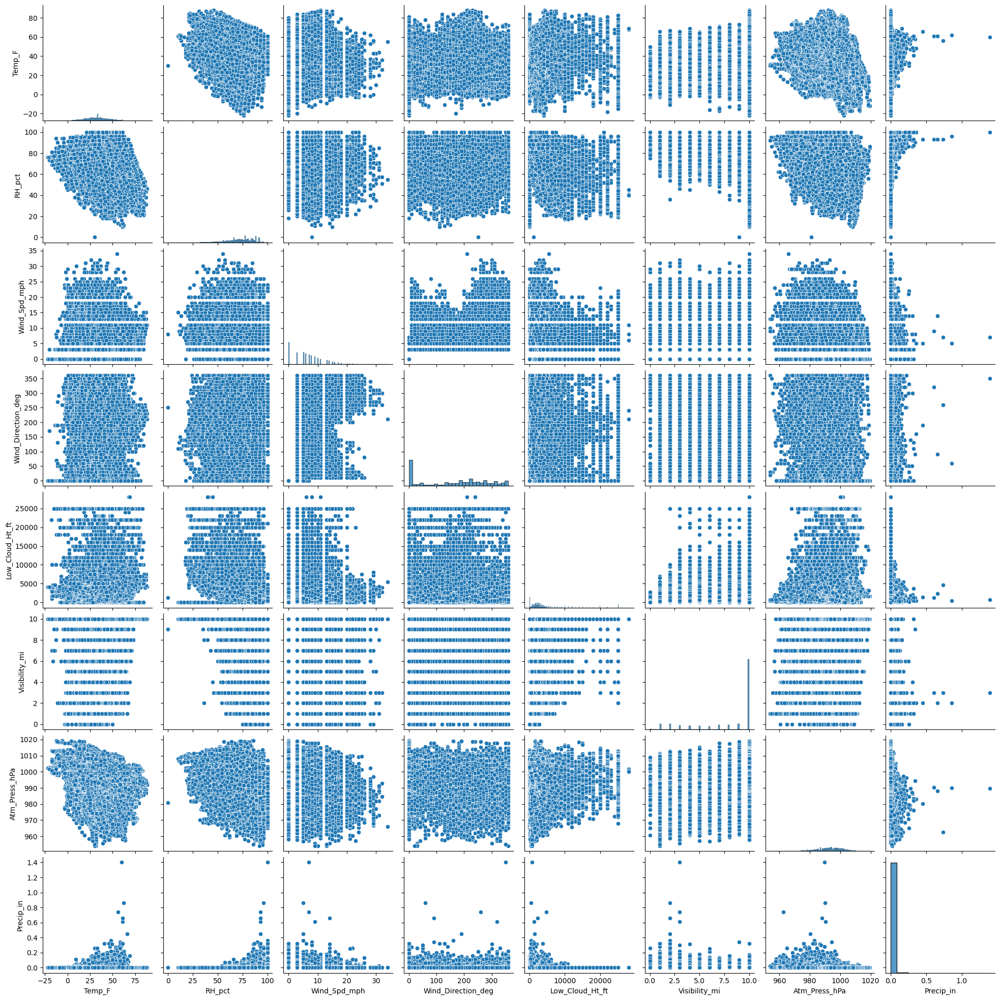

In [11]:
# Plotting the pairplot
sns.pairplot(les)
plt.show()

----

# Relationship plots between each features with precipitation

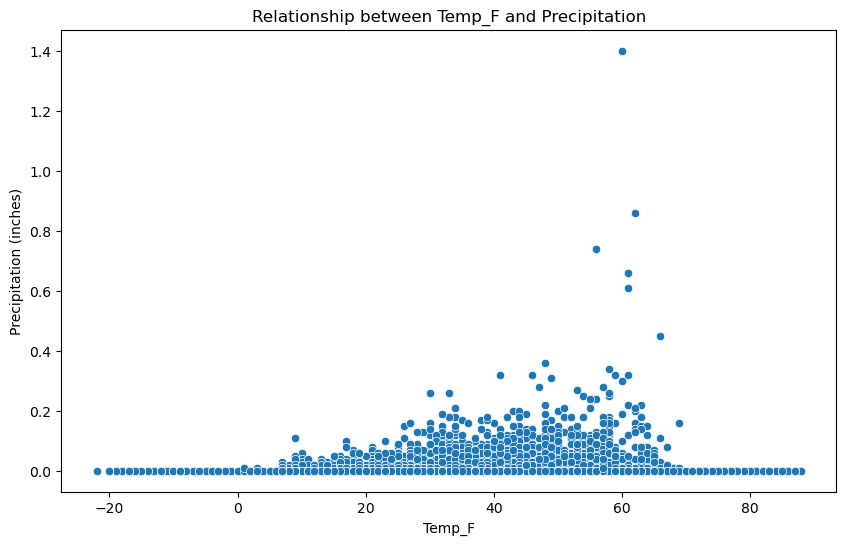

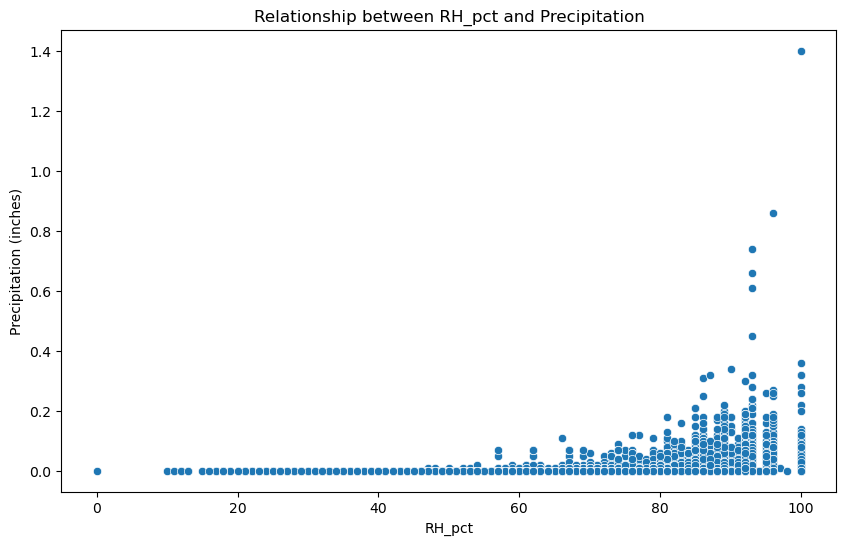

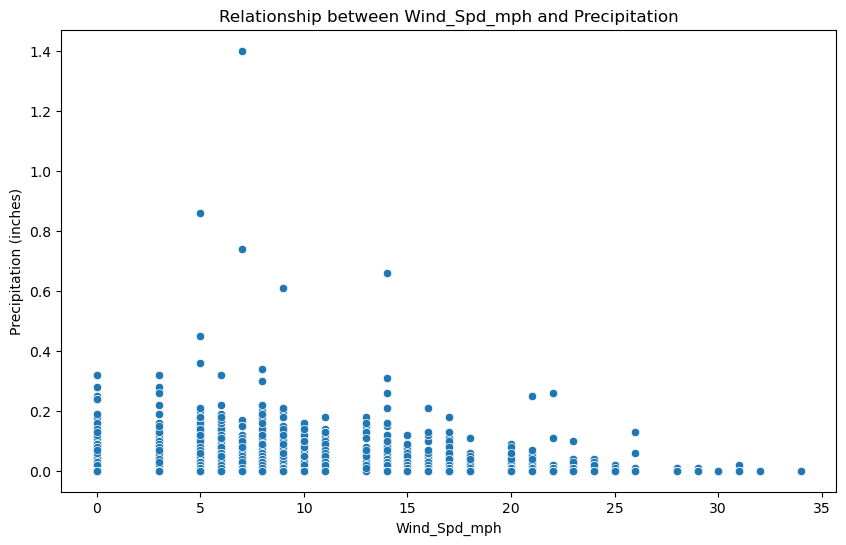

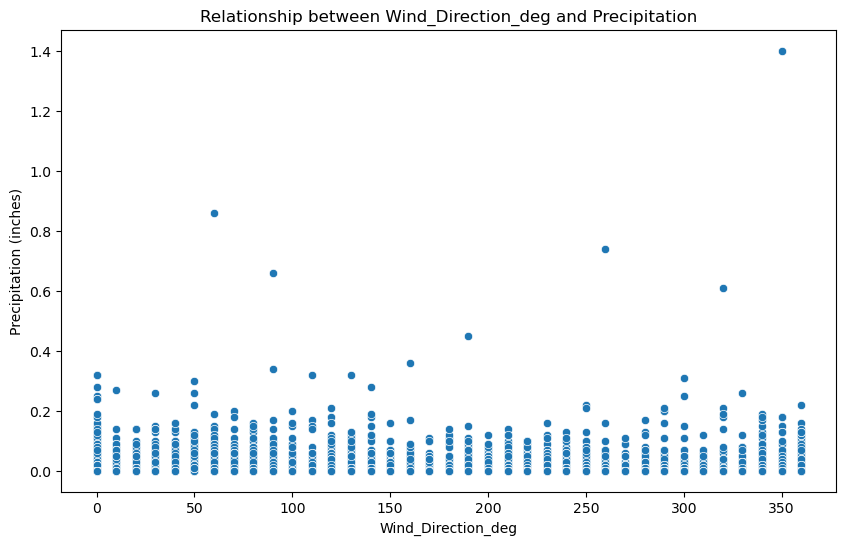

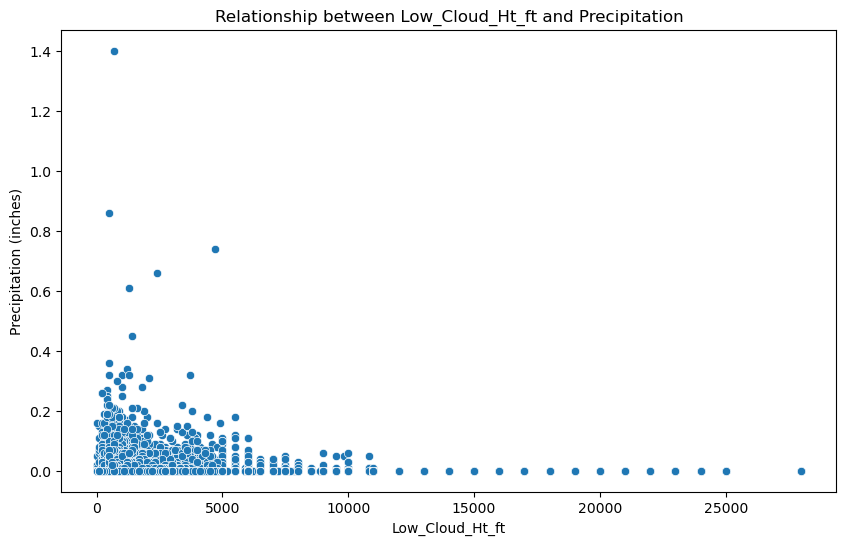

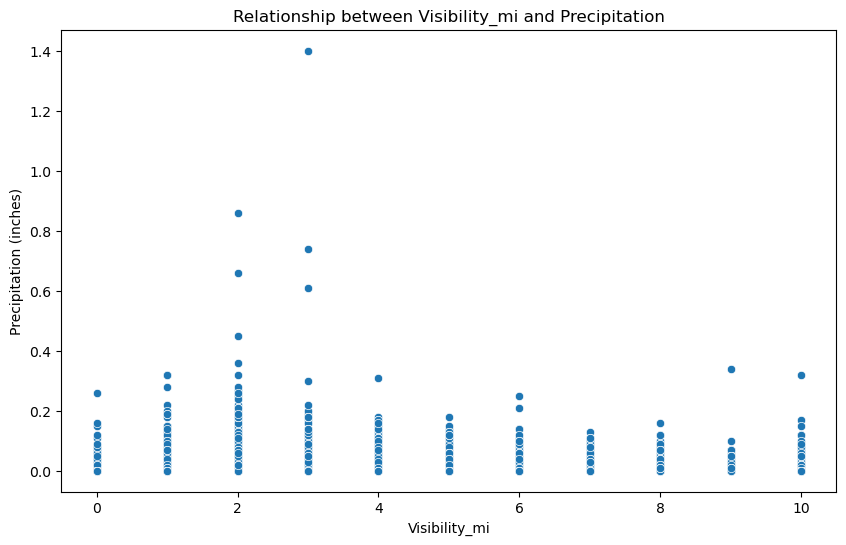

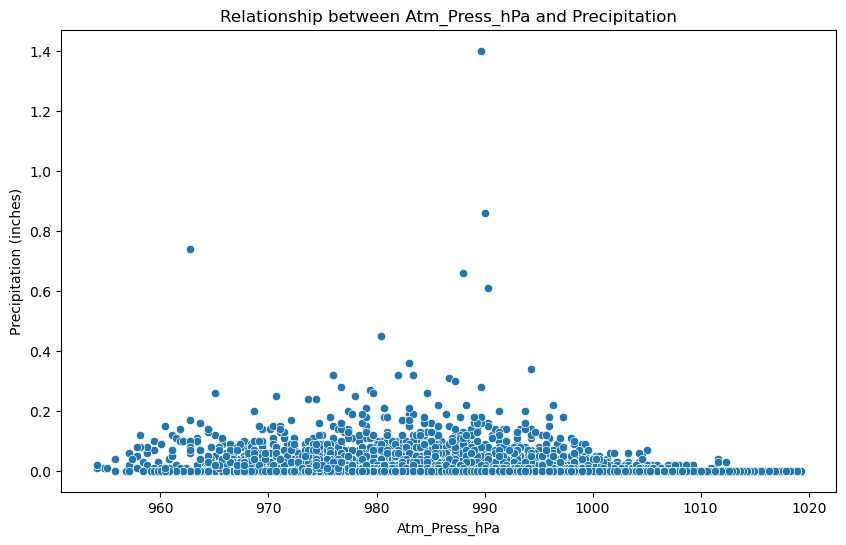

In [12]:
predictors = ['Temp_F', 'RH_pct', 'Wind_Spd_mph', 'Wind_Direction_deg', 'Low_Cloud_Ht_ft', 'Visibility_mi', 'Atm_Press_hPa']
target = 'Precip_in'

for predictor in predictors:
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x=predictor, y=target, data=les)
    plt.title(f'Relationship between {predictor} and Precipitation')
    plt.xlabel(predictor)
    plt.ylabel('Precipitation (inches)')
    plt.show()


----

# Autocorrelation plot

<Figure size 2000x600 with 0 Axes>

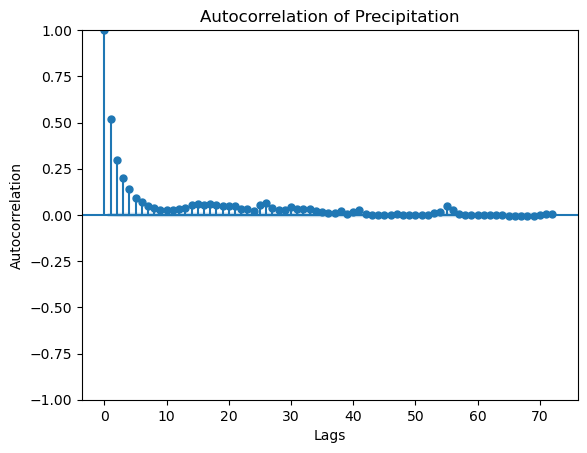

In [31]:
from statsmodels.graphics.tsaplots import plot_acf

# Autocorrelation plot for 'Precip_in'
plt.figure(figsize=(20, 6))
plot_acf(les['Precip_in'], lags=24*3)  # Adjust 'lags' as necessary based on your dataset size and time frequency
plt.title('Autocorrelation of Precipitation')
plt.xlabel('Lags')
plt.ylabel('Autocorrelation')
plt.show()

**Autocorrelation plot for daily precip data after sum up**

examining the correlation between the precipitation values at each day and its lagged values up to 30 days in the past

<Figure size 1000x600 with 0 Axes>

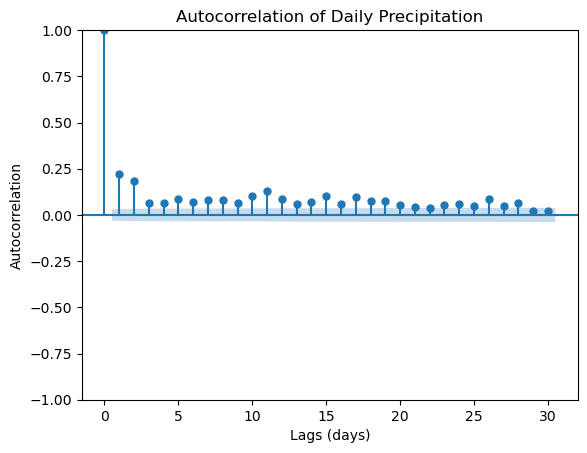

In [24]:
# Resample data to daily frequency
les_daily = les.resample('D', on='DateTime_UTC').sum()

# Autocorrelation plot for 'Precip_in'
plt.figure(figsize=(10, 6))
plot_acf(les_daily['Precip_in'], lags=30) 
plt.title('Autocorrelation of Daily Precipitation')
plt.xlabel('Lags (days)')
plt.ylabel('Autocorrelation')
plt.show()

examining the correlation between the precipitation values at each day and its lagged values up to 7 days in the past

<Figure size 1000x600 with 0 Axes>

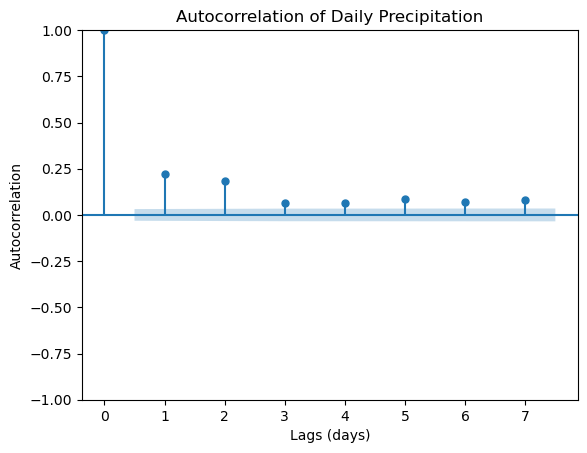

In [35]:
# Resample data to daily frequency
les_daily = les.resample('D', on='DateTime_UTC').sum()

# Autocorrelation plot for 'Precip_in'
plt.figure(figsize=(10, 6))
plot_acf(les_daily['Precip_in'], lags=7) 
plt.title('Autocorrelation of Daily Precipitation')
plt.xlabel('Lags (days)')
plt.ylabel('Autocorrelation')
plt.show()

# Partial autocorrelation plot

<Figure size 1200x600 with 0 Axes>

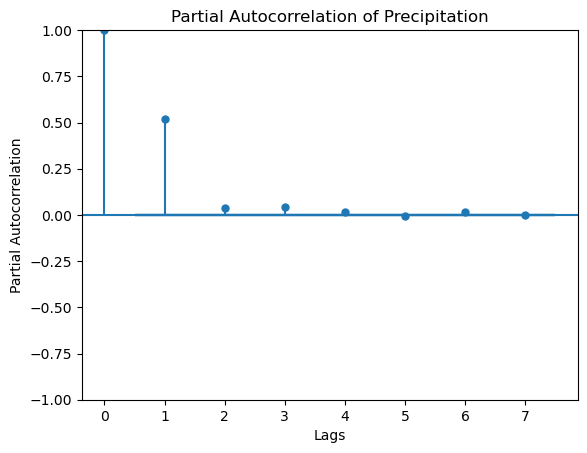

In [38]:
from statsmodels.graphics.tsaplots import plot_pacf

# Partial autocorrelation plot for 'Precip_in'
plt.figure(figsize=(12, 6))
plot_pacf(les['Precip_in'], lags=7)
plt.title('Partial Autocorrelation of Precipitation')
plt.xlabel('Lags')
plt.ylabel('Partial Autocorrelation')
plt.show()

**Partial autocorrelation for daily precip data after sum up**

<Figure size 1000x600 with 0 Axes>

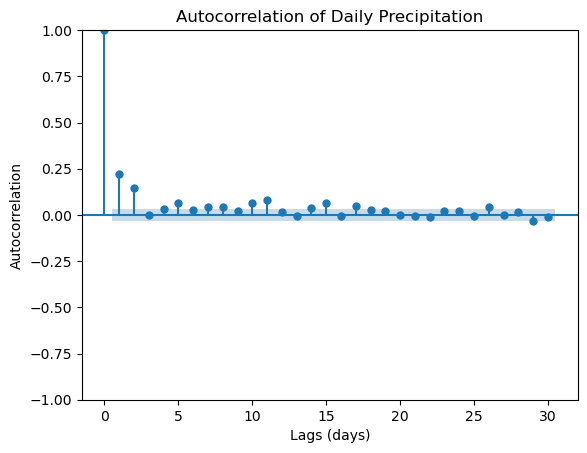

In [40]:
# Resample data to daily frequency
les_daily = les.resample('D', on='DateTime_UTC').sum()

# Autocorrelation plot for 'Precip_in'
plt.figure(figsize=(10, 6))
plot_pacf(les_daily['Precip_in'], lags=30) 
plt.title('Autocorrelation of Daily Precipitation')
plt.xlabel('Lags (days)')
plt.ylabel('Autocorrelation')
plt.show()